In [1]:
import os
import polars as pl
import vaex
import matplotlib.pyplot as plt
import seaborn as sns
project_path = "C:/Users/imayz/Documents/uber"

Leer archivos y analizar datos básicos sobre las variables

In [2]:
uber_fares = pl.scan_csv(project_path + "/data/raw_data/train.csv",
    separator=",",
    encoding="utf8",
    dtypes={"key": pl.String,
            "pickup_datetime": pl.String,
            "pickup_longitude": pl.Float64,  "pickup_latitude": pl.Float64,
             "dropoff_longitude": pl.Float64, "dropoff_latitude": pl.Float64,
            "passenger_count": pl.Int64}
    )

In [3]:
# resumen del dataframe
uber_fares.describe(percentiles=[0.25, 0.5, 0.7, 0.9, 0.99])

statistic,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
str,str,f64,str,f64,f64,f64,f64,f64
"""count""","""55423856""",5.5423856e7,"""55423856""",5.5423856e7,5.5423856e7,5.542348e7,5.542348e7,5.5423856e7
"""null_count""","""0""",0.0,"""0""",0.0,0.0,376.0,376.0,0.0
"""mean""",null,11.345046,null,-72.509684,39.919792,-72.51121,39.920681,1.68538
"""std""",null,20.710832,null,12.848883,9.642353,12.782197,9.633346,1.327664
"""min""","""2009-01-01 00:…",-300.0,"""2009-01-01 00:…",-3442.059565,-3492.263768,-3442.024565,-3547.886698,0.0
…,…,…,…,…,…,…,…,…
"""50%""",null,8.5,null,-73.981803,40.752652,-73.98015,40.753157,1.0
"""70%""",null,11.5,null,-73.971247,40.763933,-73.968826,40.764365,2.0
"""90%""",null,20.5,null,-73.950714,40.779808,-73.945519,40.782769,4.0


Algunas observaciones que se puede hacer con es primer analisis son:
* la media de la tarifa son $11.34, el valor del percentil 90 es de $53 dls, ademeas hay valores negativos y el valor máximo es más de 9k
* valores nulos en dropoff_longitude y dropoff_latitude
* valores minimos y maximos pickup_longitude, pickup_latitude parecen estar muy por fuera de la medía, quizas sea coordenadas fuera de NY
* el valor maximo de passenger_count es de 208, no es posible ese cantidad de personas en un automovil

Es obvio que hay algunos valores que pudiesen ser datos erroneos o  atipicos, pero debido a que se cuenta con más de 55M de registros, para la limpieza de los datos podemos optar por omitir los registros que no cumplan con las reglas que vayamos defiendo en este análisis.


## Omitir datos nullos en coordenadas 

In [4]:
uber_fares = uber_fares.drop_nulls(subset=["dropoff_longitude","dropoff_latitude"])

## Vizualizando viajes
Veamos como se ven los viajes usando las coordenadas de partida

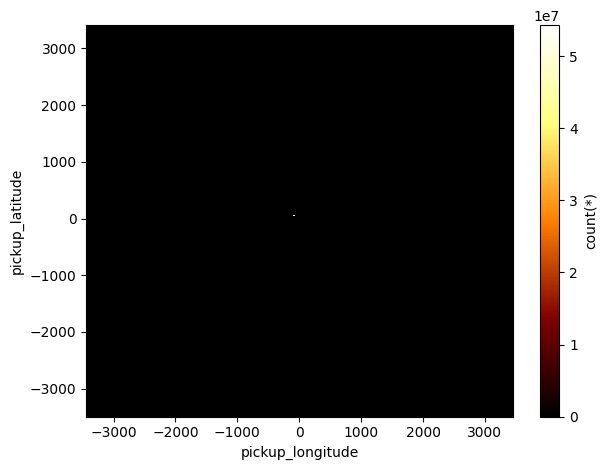

In [5]:
fares_vaex = vaex.open(project_path + "/data/raw_data/train.csv")
ny_map = fares_vaex.viz.heatmap(
    fares_vaex.pickup_longitude,
    fares_vaex.pickup_latitude,
   )
ny_map

Se aprecia si hay datos muy fuera de la zona de NY, limiantado la zona de NY se ve mejor

In [6]:
#limites aproximados NY
ny_longitude = [-74.05, -73.69]
ny_latitude = [40.55, 40.90]

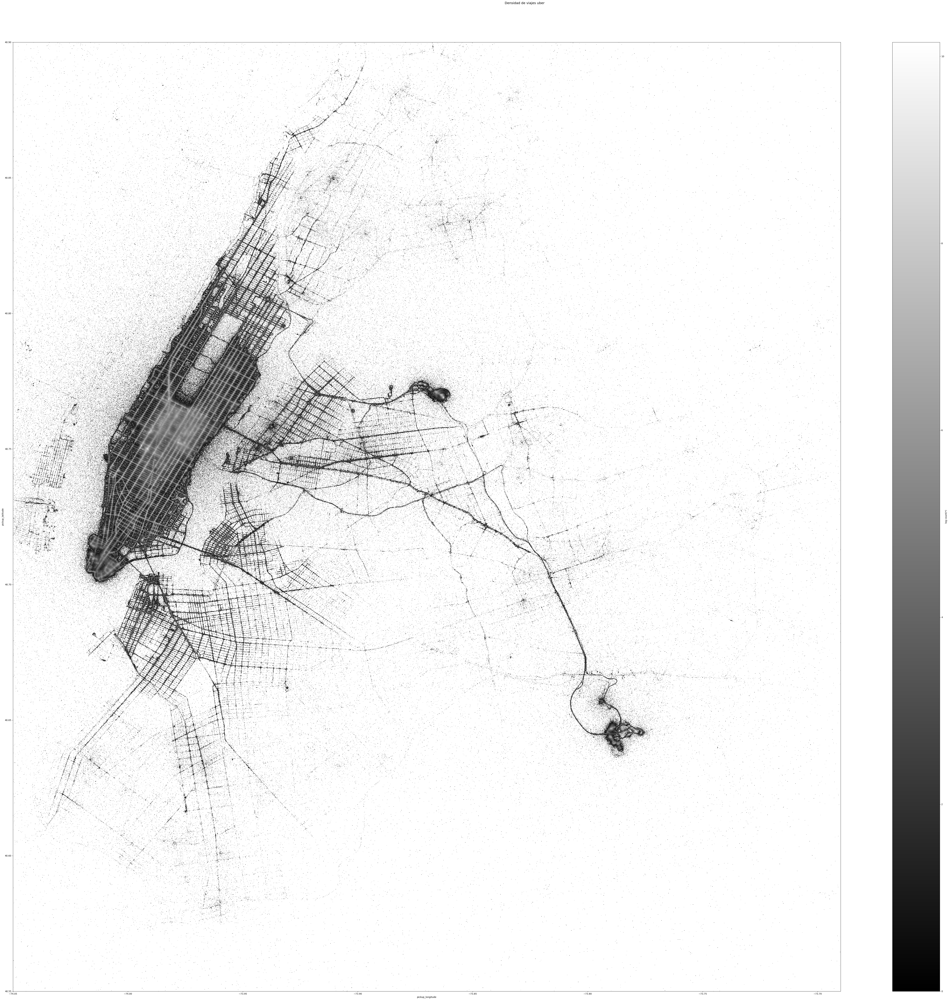

In [7]:
fares_vaex.viz.heatmap(
    fares_vaex.pickup_longitude,
    fares_vaex.pickup_latitude,
    title="Densidad de viajes uber",
    f='log', # logaritmo de conteo de puntos
    shape=4096, # tamaño del grid
    figsize=(64,64),
    colormap="gist_gray",
    limits=[ny_longitude,ny_latitude]
    )

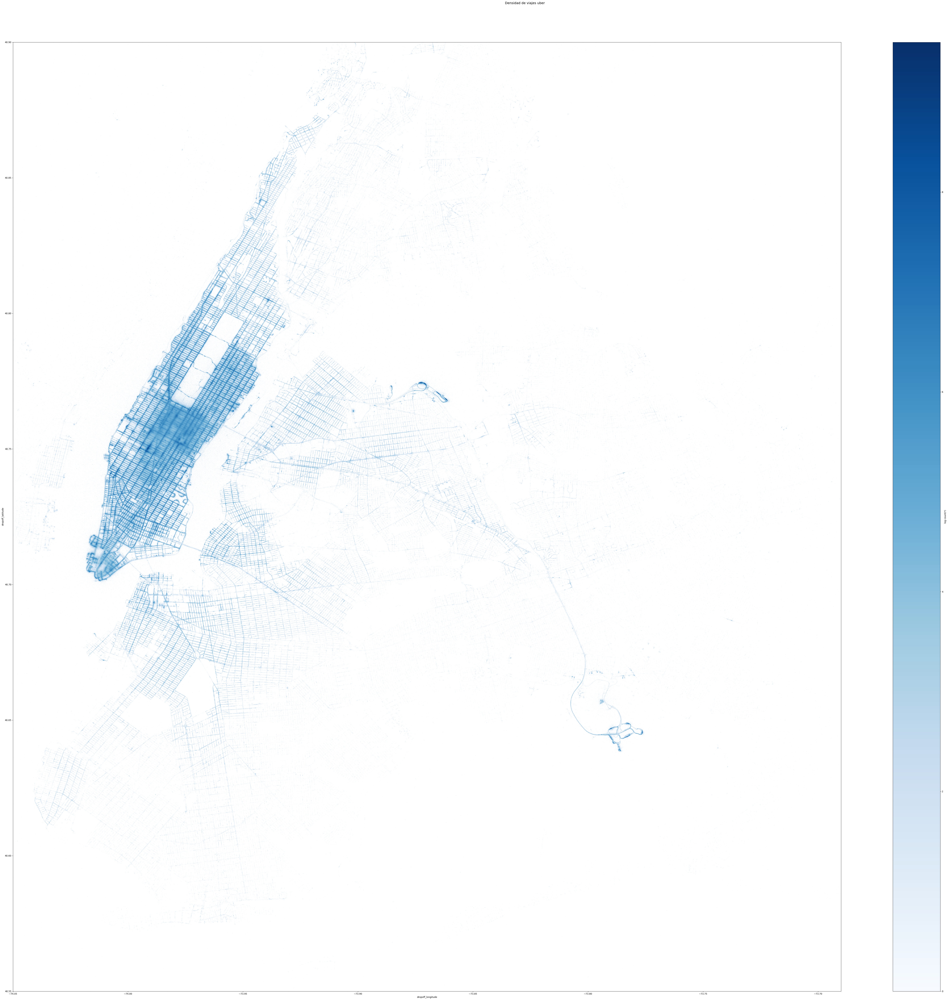

In [8]:
fares_vaex.viz.heatmap(
    fares_vaex.dropoff_longitude,
    fares_vaex.dropoff_latitude,
    title="Densidad de viajes uber",
    f='log', # logaritmo de conteo de puntos
    shape=4096, # tamaño del grid
    figsize=(64,64),
    colormap="Blues",
    limits=[ny_longitude,ny_latitude]
    )

## Filtrar viajes solo en la zona de NY

In [9]:
uber_fares = uber_fares.filter(
    pl.col("pickup_longitude") >= ny_longitude[0], pl.col("pickup_longitude") <= ny_longitude[1],
    pl.col("pickup_latitude") >= ny_latitude[0], pl.col("pickup_latitude") <= ny_latitude[1]
    )

# filtrar puntos de destino
uber_fares = uber_fares.filter(
    pl.col("dropoff_longitude") >= ny_longitude[0], pl.col("dropoff_longitude") <= ny_longitude[1],
    pl.col("dropoff_latitude") >= ny_latitude[0], pl.col("dropoff_latitude") <= ny_latitude[1]
    )

## Filtrar montos de tarifas
Vamos a eliminar tarifas menores a cero y menores a 100 dlls

In [10]:
uber_fares = uber_fares.filter(
    pl.col("fare_amount") > 0,
    pl.col("fare_amount") <= 100
    )

veamos como se distribuyen los precios

[Text(0.5, 1.0, 'Distribución de precios de tarifa')]

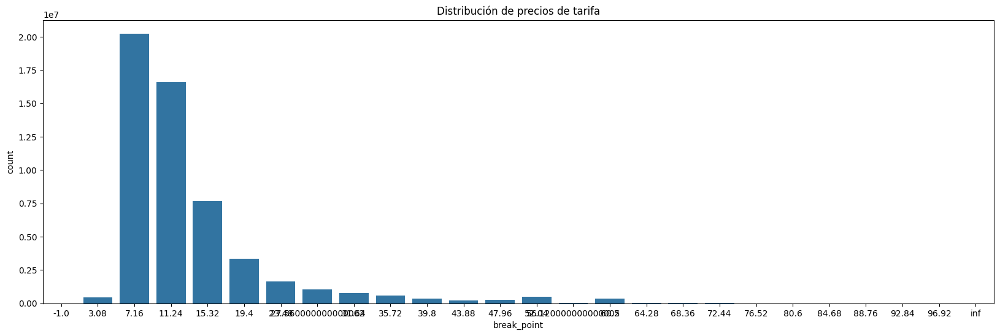

In [11]:
fare_histogram = uber_fares.select(
        pl.col("fare_amount")
        .hist(bin_count=25,
        include_category=True,
        include_breakpoint=True)
    ).collect().unnest("fare_amount")

plt.figure(figsize=(20, 6))
sns.barplot(
    x=fare_histogram["break_point"],
    y=fare_histogram["count"]
    ).set(title='Distribución de precios de tarifa')

# Calculo de distancia entre puntos de partida y destino

Se se sabe la distancia real o ruta para cada viaje, así que se puede aproximiar la distancia de cada viajes, usando la distancia de Harvesine

In [12]:
uber_fares = uber_fares.with_columns(
    [
        pl.col("pickup_longitude").radians().alias("pickup_longitude_rad"),
        pl.col("pickup_latitude").radians().alias("pickup_latitude_rad"),
        pl.col("dropoff_longitude").radians().alias("dropoff_longitude_rad"),
        pl.col("dropoff_latitude").radians().alias("dropoff_latitude_rad")
    ]
    ).with_columns(
    [
        ((pl.col("dropoff_latitude_rad") - pl.col("pickup_latitude_rad")) / 2).alias("diff_lat_2"),
        ((pl.col("dropoff_longitude_rad") - pl.col("pickup_longitude_rad")) / 2).alias("diff_long_2"),
    ]
    ).with_columns(

          (pl.col("diff_lat_2").sin()**2 +(
          pl.col("dropoff_latitude_rad").cos() * pl.col("pickup_latitude_rad").cos() * pl.col("diff_long_2").sin()**2))
          .alias("inner_results")

    ).with_columns(
       (6371*2*pl.arctan2(
            pl.col("inner_results").sqrt(),
            (1-pl.col("inner_results")).sqrt()
        )).alias("distance")

    ).select(["key", "fare_amount", "pickup_datetime", "pickup_longitude",
    "pickup_latitude", "dropoff_longitude", "dropoff_latitude", "passenger_count",
    "distance"
    ])

Descripción distancia

In [13]:
distance_summary = uber_fares.select(
    pl.col("distance")).describe(
        percentiles=[0.25, 0.5, 0.75, 0.9, 0.99]
    )
distance_summary

statistic,distance
str,f64
"""count""",5.4045798e7
"""null_count""",0.0
"""mean""",3.278379
"""std""",3.490272
"""min""",0.0
…,…
"""50%""",2.149148
"""75%""",3.890563
"""90%""",6.935986


In [14]:
distance_histogram = uber_fares.select(
        pl.col("distance")
        .hist(bin_count=25,
        include_category=True,
        include_breakpoint=True)
    ).collect().unnest("distance")


In [15]:
distance_histogram = distance_histogram.filter(pl.col("break_point")>0)\
    .with_columns(pl.col("break_point").cast(pl.String)\
    .str.slice(0, 4)
    .alias("break_point"))

[Text(0.5, 1.0, 'Distribución de distancia de viaje')]

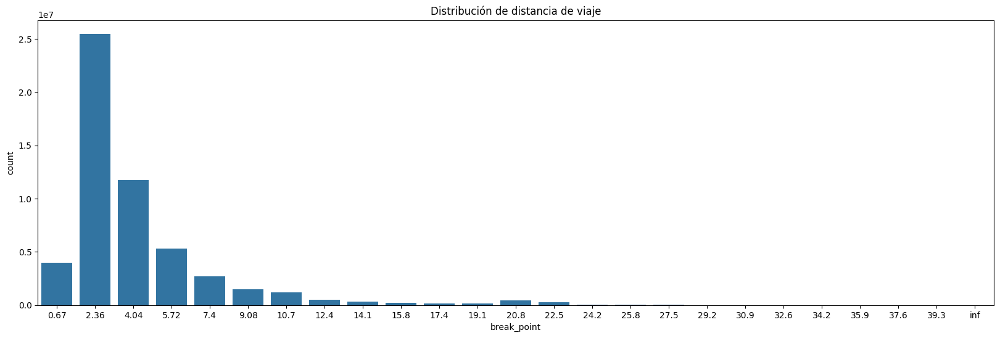

In [16]:
plt.figure(figsize=(20, 6))
sns.barplot(
    x=distance_histogram["break_point"],
    y=distance_histogram["count"]
    ).set(title='Distribución de distancia de viaje')

La media de distancia es de 3.2 KM y el 99% de lo viajes la distancia es de 20.3 KM y casi hasta 40KM los viajes más largos
Tambien existen viajes con distancia cero, mismo punto de partida y destino, sera mejor omitirlos

# Filtrar viajes con distancia mayor a cero

In [17]:
# solo viajes con distancias mayores a 0
uber_fares = uber_fares.filter(
    pl.col("distance") > 0
)

## Viarbles extra relacionas con la temporalidad


Se pueden crear variables axuliares a partir de la informacion de la columna pickup_datetime:
* Año del viaje
* Mes del viaje
* Hora del viaje
* Día de la semana

In [18]:
uber_fares = uber_fares.with_columns(
    pl.col("pickup_datetime")
    .str.to_datetime(format="%Y-%m-%d %H:%M:%S %Z",
                      strict=False)
)
#obtener solo la hora
uber_fares = uber_fares.with_columns(
    [
        pl.col("pickup_datetime").dt.hour().alias("pickup_time"),
        pl.col("pickup_datetime").dt.year().alias("pickup_year"),
        pl.col("pickup_datetime").dt.month().alias("pickup_month"),
        pl.col("pickup_datetime").dt.hour().alias("pickup_hour"),
        pl.col("pickup_datetime").dt.weekday().alias("pickup_day")
    ])


In [19]:
# guardar como parquet todas tranformaciones echas hasta el momento y volver a cargar el archivo con datos limpios
#uber_fares.collect().write_parquet('data/clean/clean_data.parquet',use_pyarrow=True, compression='zstd'
#uber_fares = pl.scan_parquet(project_path +"/data/clean/train.parquet")

## Tarifa por KM

Calculo de tarfifa por km recorrrido y estadistica descriptiva de la nueva variable

In [20]:
uber_fares = uber_fares.with_columns(
    (pl.col("fare_amount") / pl.col("distance")).alias("fare_per_km"))

In [21]:
# el costo promedio por KM es de 59,
# adicional el percentil 99 esta por debajo de los 24
uber_fares.select(pl.col("fare_per_km")).describe(
    percentiles=[0.1, 0.35, 0.5, 0.7, 0.9, 0.99]
    )

statistic,fare_per_km
str,f64
"""count""",5.3497222e7
"""null_count""",0.0
"""mean""",59.775302
"""std""",3184.373178
"""min""",0.000427
…,…
"""50%""",3.821254
"""70%""",4.733047
"""90%""",6.810714


El costo promedio por KM es de 59, adicional el percentil 99 esta por debajo de los 24. podemos omitir viajes donde la tarifa por kilometro sea mayor a 50KM

In [22]:
uber_fares = uber_fares.filter(
    pl.col("fare_per_km") < 50,
    pl.col("fare_per_km") > 0
    )

In [23]:
uber_fares.select(pl.col("fare_per_km")).describe(
    percentiles=[0.1, 0.35, 0.5, 0.7, 0.9, 0.99]
    )

statistic,fare_per_km
str,f64
"""count""",5.3153238e7
"""null_count""",0.0
"""mean""",4.421626
"""std""",2.81839
"""min""",0.000427
…,…
"""50%""",3.809203
"""70%""",4.706965
"""90%""",6.690174


[Text(0.5, 1.0, 'Distribución de tarifa por KM')]

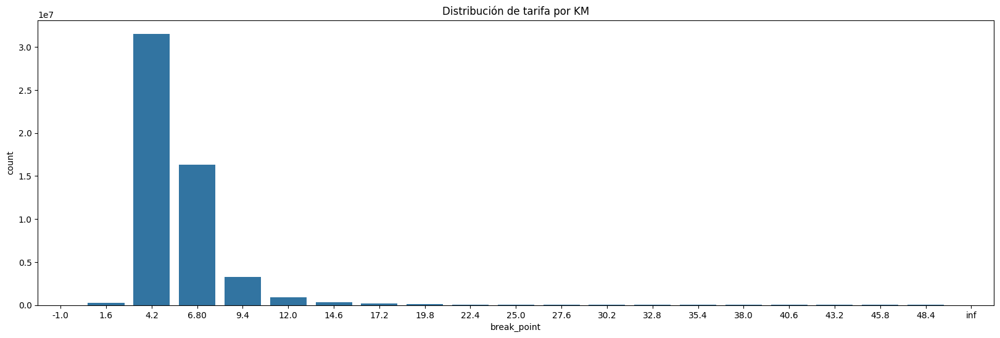

In [24]:
fare_per_km_hist = uber_fares.select(
        pl.col("fare_per_km")
        .hist(bin_count=20,
        include_breakpoint=True)
    ).collect().unnest("fare_per_km")

fare_per_km_hist = fare_per_km_hist.with_columns(
    pl.col("break_point").cast(pl.String)
    .str.slice(0,4)
    .alias("break_point")
    )

plt.figure(figsize=(20, 6))
sns.barplot(
    x=fare_per_km_hist["break_point"],
    y=fare_per_km_hist["count"]
    ).set(title='Distribución de tarifa por KM')

## Tarifa promedio por año
Se puede ver si existe una relacion entre el año en el que fue el viaje y el costo promedio del mismo

In [25]:
mean_fare_per_year = uber_fares.group_by("pickup_year")\
    .agg(tarifia_promedio=pl.mean("fare_amount")).collect()\
    .sort(by=["pickup_year"])

[Text(0.5, 1.0, 'Tarifa promedio por año'),
 Text(0.5, 0, 'Año del viaje'),
 Text(0, 0.5, 'Tarifa promedio')]

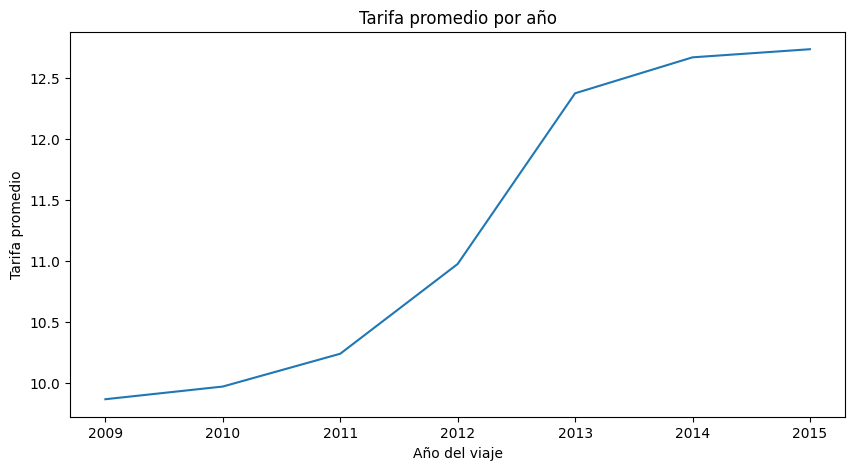

In [26]:
plt.figure(figsize=(10, 5))
sns.lineplot(
    x=mean_fare_per_year["pickup_year"],
    y=mean_fare_per_year["tarifia_promedio"]
    ).set(title='Tarifa promedio por año',
    xlabel="Año del viaje", ylabel="Tarifa promedio")

In [27]:
mean_fare_per_year

pickup_year,tarifia_promedio
i32,f64
2009,9.86972
2010,9.973476
2011,10.241606
2012,10.975398
2013,12.371285
2014,12.665263
2015,12.731574


Desde el 2009 existe un incremento en la tarifa, particularmente de 2012 a 2013 el alza es más evidente.

Parece ser que existe una relación creciente el año el precio promedio del viaje.



# Distancia y tarifa del viaje

[Text(0.5, 1.0, 'Tarifa y distancia del viaje'),
 Text(0.5, 0, 'Distancia del viaje'),
 Text(0, 0.5, 'Tarifa')]

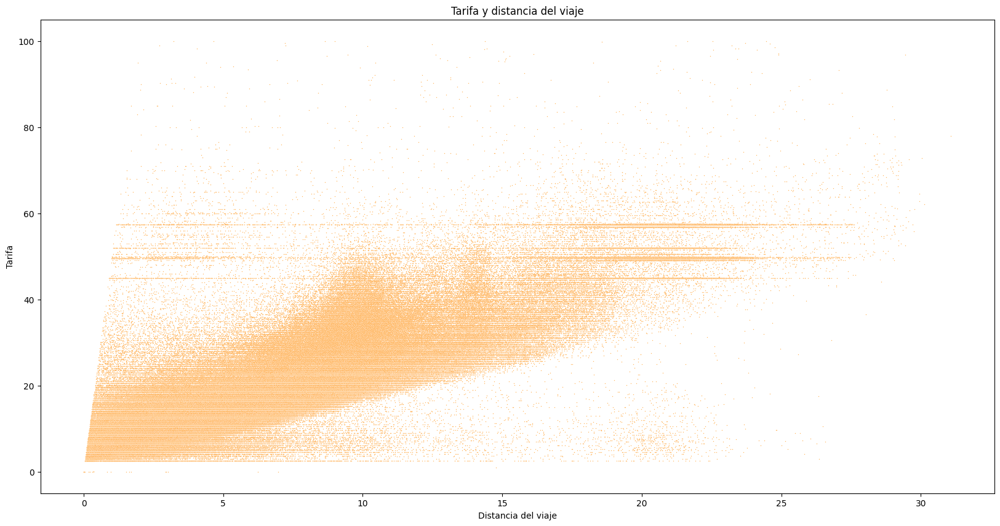

In [28]:
distance_fare = uber_fares.select(["fare_amount", "distance"])\
    .head(3_000_000).collect()

plt.figure(figsize=(20, 10))
distance_fare = sns.scatterplot(
    x=distance_fare["distance"],
    y=distance_fare["fare_amount"],
    s=1,
    color="#FFB459",
    ).set(title='Tarifa y distancia del viaje',
    xlabel="Distancia del viaje", ylabel="Tarifa")
distance_fare

Parece ser que existe un relación entre la distancia y la tarifa del viaje.

Entre los $40 y $60 dlls existe una gran cantidad de viajes que no importa la distancia recorrida, el costo es el mismo.

Pueden ser tarifas con precios fijos.

## Tarifa por KM y hora del viaje

In [40]:
hour_fare_perkm = uber_fares.group_by(["pickup_hour", "pickup_year"])\
    .agg(fare_per_km_promedio=pl.mean("fare_per_km")).collect()\
    .sort(by="pickup_hour")

[Text(0.5, 1.0, 'Hora del viaje y tarifa por KM'),
 Text(0.5, 0, 'Hora de inicio del viaje'),
 Text(0, 0.5, 'Tarifa por KM promedio')]

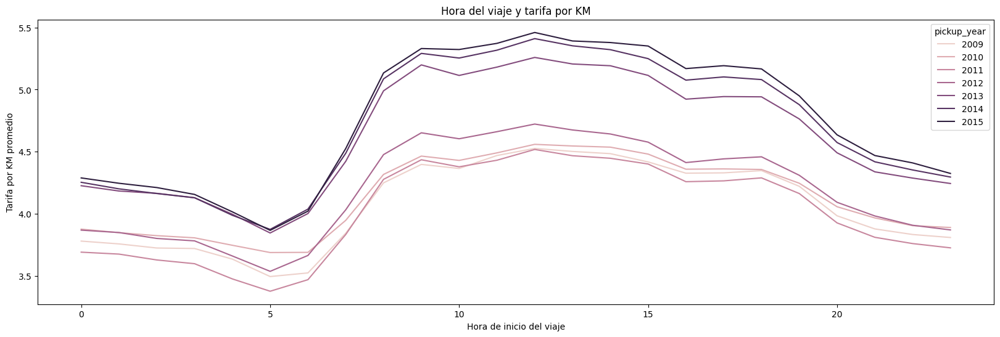

In [41]:
plt.figure(figsize=(20, 6))
sns.lineplot(
    x=hour_fare_perkm["pickup_hour"],
    y=hour_fare_perkm["fare_per_km_promedio"],
    hue=hour_fare_perkm["pickup_year"]
    ).set(title='Hora del viaje y tarifa por KM',
        xlabel="Hora de inicio del viaje",
        ylabel="Tarifa por KM promedio"
        )

El costo de la tarifa promedio por KM varia de acuerdo a la hora, siendo las madragadas las tarifas más bajas y partir de las 5AM el costo comienza a incrementar

In [43]:
hour_fare_perkm.write_csv("gour.csv")

In [31]:
day_fare_perkm = uber_fares.group_by(["pickup_day", "pickup_year"])\
    .agg(fare_per_km_promedio=pl.mean("fare_per_km")).collect()\
    .sort(by="pickup_day")

In [44]:
day_fare_perkm

pickup_day,pickup_year,fare_per_km_promedio
i8,i32,f64
1,2011,4.023996
1,2015,4.7959
1,2012,4.209733
1,2010,4.164948
1,2009,4.08498
…,…,…
7,2015,4.495214
7,2011,3.824464
7,2009,3.900153


[Text(0.5, 1.0, 'Día de la semana del viaje y tarifa por KM'),
 Text(0.5, 0, 'Día de la semana'),
 Text(0, 0.5, 'Tarifa por KM promedio')]

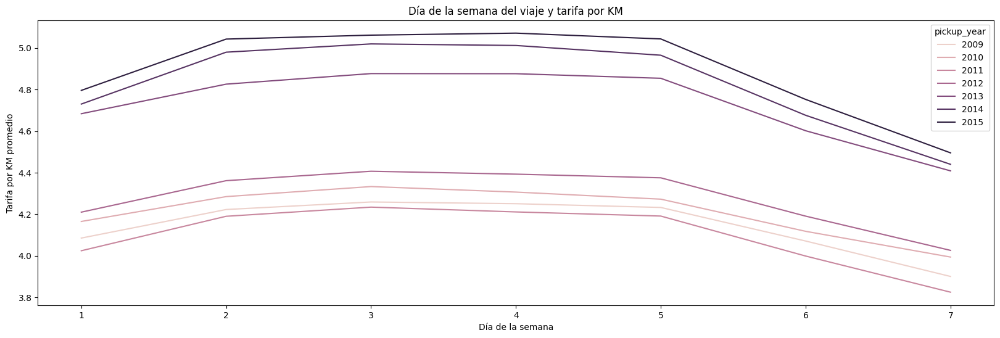

In [32]:
plt.figure(figsize=(20, 6))
sns.lineplot(
    x=day_fare_perkm["pickup_day"],
    y=day_fare_perkm["fare_per_km_promedio"],
    hue=day_fare_perkm["pickup_year"]
    ).set(title='Día de la semana del viaje y tarifa por KM',
        xlabel="Día de la semana",
        ylabel="Tarifa por KM promedio"
        )

In [45]:
day_fare_perkm.write_csv("day.csv")

In [34]:
month_fare_perkm = uber_fares.group_by(["pickup_month", "pickup_year"])\
    .agg(fare_per_km_promedio=pl.mean("fare_per_km")).collect()\
    .sort(by="pickup_month")

[Text(0.5, 1.0, 'Mes del viaje y tarifa por KM'),
 Text(0.5, 0, 'MEs'),
 Text(0, 0.5, 'Tarifa por KM promedio')]

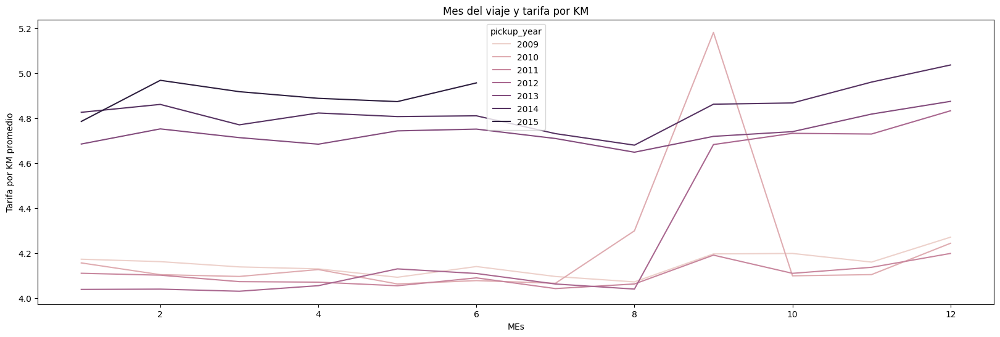

In [35]:
plt.figure(figsize=(20, 6))
sns.lineplot(
    x=month_fare_perkm["pickup_month"],
    y=month_fare_perkm["fare_per_km_promedio"],
    hue=month_fare_perkm["pickup_year"]
    ).set(title='Mes del viaje y tarifa por KM',
        xlabel="MEs",
        ylabel="Tarifa por KM promedio"
        )

In [36]:
trips_per_yer = uber_fares.group_by("pickup_year").agg(Viajes=pl.count("key")).collect()

In [37]:
trips_per_yer.write_csv("trips.csv")

[Text(0.5, 1.0, 'Viajes en taxi'), Text(0.5, 0, 'Año'), Text(0, 0.5, 'Viajes')]

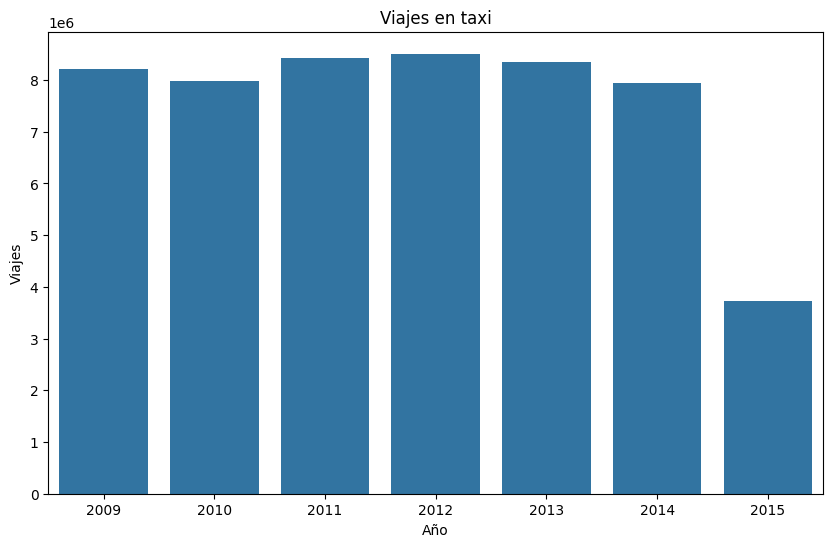

In [38]:
plt.figure(figsize=(10, 6))
sns.barplot(
    x=trips_per_yer["pickup_year"],
    y=trips_per_yer["Viajes"]
    ).set(title='Viajes en taxi',
        xlabel="Año",
        ylabel="Viajes"
        )